<a href="https://colab.research.google.com/github/elisa-desmetz/H3_Deep_Learning/blob/master/FastAI_02_Dogs.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
!pip install -Uqq fastbook
import fastbook
fastbook.setup_book()

     |████████████████████████████████| 112 kB 4.1 MB/s 
     |████████████████████████████████| 455 kB 21.8 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
voila 0.3.0 requires nbconvert<7,>=6.0.0, but you have nbconvert 5.6.1 which is incompatible.
google-colab 1.0.0 requires tornado~=5.1.0; python_version >= "3.0", but you have tornado 6.1 which is incompatible.


In [4]:
from fastbook import *
from fastai.vision.widgets import *

In [5]:
!pip install voila
!jupyter server extension enable voila.server_extension --sys-prefix

  Using cached nbconvert-6.4.0-py3-none-any.whl (557 kB)
  Attempting uninstall: nbconvert
    Found existing installation: nbconvert 5.6.1
    Uninstalling nbconvert-5.6.1:
      Successfully uninstalled nbconvert-5.6.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
nbdev 1.1.23 requires nbconvert<6, but you have nbconvert 6.4.0 which is incompatible.
google-colab 1.0.0 requires tornado~=5.1.0; python_version >= "3.0", but you have tornado 6.1 which is incompatible.


Enabling: voila.server_extension
- Writing config: /usr/etc/jupyter
    - Validating voila.server_extension...
      voila.server_extension  OK
    - Extension successfully enabled.


In [6]:
key = os.environ.get('AZURE_SEARCH_KEY', '3d9462113f684f77981cc120b1e2d09d')

In [21]:
dog_type = 'retriever','doberman','husky'
path = Path('dog')

In [22]:
if not path.exists():
    path.mkdir()
    for o in dog_type:
        dest = (path/o)
        dest.mkdir(exist_ok=True)
        results = search_images_bing(key, f'{o} dog')
        download_images(dest, urls=results.attrgot('contentUrl'))

In [28]:
fns = get_image_files(path)
fns

(#434) [Path('dog/doberman/00000148.jpg'),Path('dog/doberman/00000049.jpg'),Path('dog/doberman/00000095.jpg'),Path('dog/doberman/00000105.jpg'),Path('dog/doberman/00000138.JPG'),Path('dog/doberman/00000134.jpg'),Path('dog/doberman/00000086.jpg'),Path('dog/doberman/00000106.jpg'),Path('dog/doberman/00000056.jpg'),Path('dog/doberman/00000060.jpg')...]

In [29]:
failed = verify_images(fns)
failed

(#0) []

In [30]:
failed.map(Path.unlink);

In [31]:
dogs = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_items=get_image_files, 
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128))

In [32]:
dls = dogs.dataloaders(path)

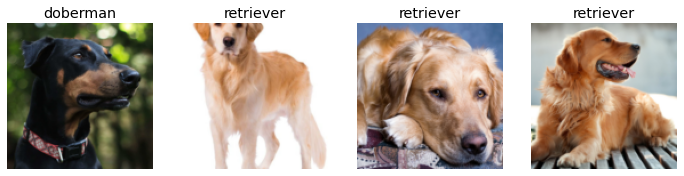

In [33]:
dls.valid.show_batch(max_n=4, nrows=1)

In [34]:
dogs = dogs.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = dogs.dataloaders(path)

In [35]:
learn = cnn_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

epoch,train_loss,valid_loss,error_rate,time
0,1.166888,0.105513,0.011628,00:28


epoch,train_loss,valid_loss,error_rate,time
0,0.100317,0.056945,0.011628,00:29
1,0.123370,0.043386,0.011628,00:28
2,0.090283,0.034220,0.011628,00:30
3,0.067416,0.031398,0.011628,00:29


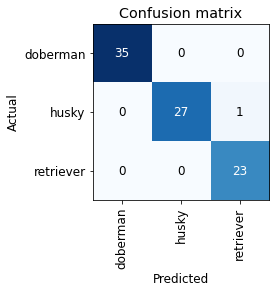

In [36]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

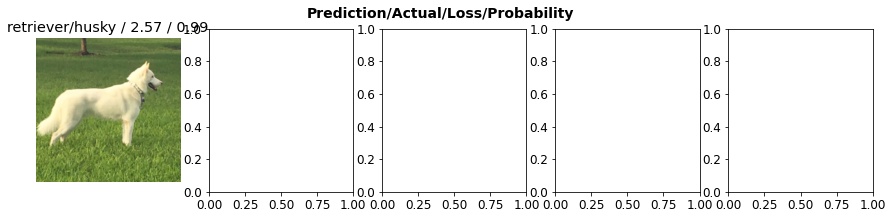

In [37]:
interp.plot_top_losses(5, nrows=1)

In [38]:
#hide_output
cleaner = ImageClassifierCleaner(learn)
cleaner

In [39]:
learn.export()

In [40]:
path = Path()
path.ls(file_exts='.pkl')

(#1) [Path('export.pkl')]

In [41]:
learn_inf = load_learner(path/'export.pkl')

In [42]:
learn_inf.dls.vocab

['doberman', 'husky', 'retriever']

In [43]:
btn_upload = widgets.FileUpload()
btn_upload

FileUpload(value={}, description='Upload')

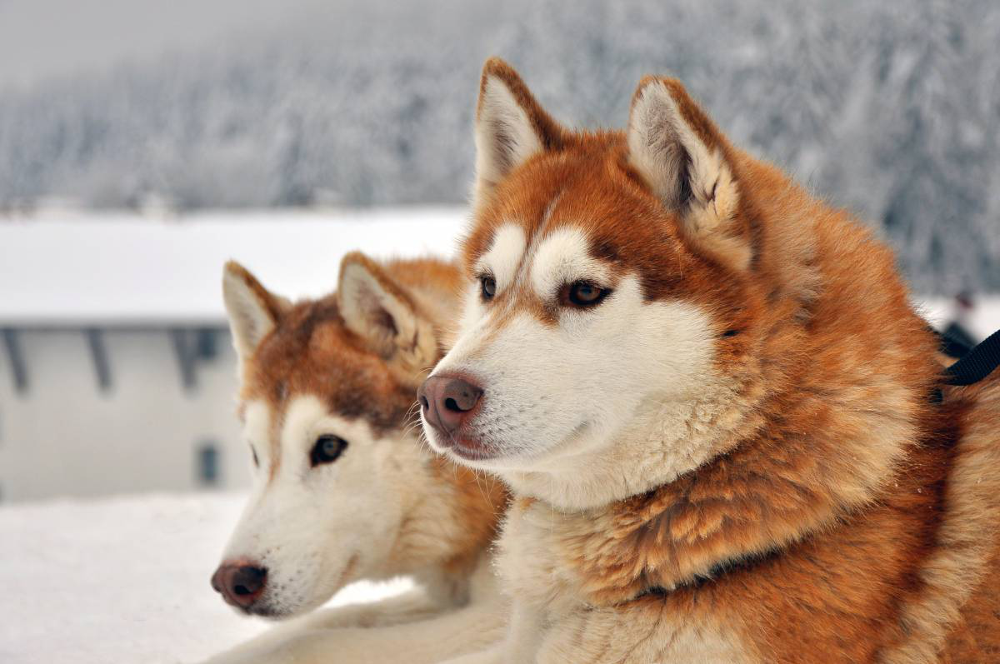

In [46]:
img = PILImage.create(btn_upload.data[0])
img

In [47]:
out_pl = widgets.Output()
out_pl.clear_output()
with out_pl: display(img.to_thumb(128,128))
out_pl

Output()

In [48]:
pred,pred_idx,probs = learn_inf.predict(img)

In [49]:
#hide_output
lbl_pred = widgets.Label()
lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'
lbl_pred

Label(value='Prediction: husky; Probability: 1.0000')

In [50]:
#hide_output
btn_run = widgets.Button(description='Classify')
btn_run

Button(description='Classify', style=ButtonStyle())

In [53]:
def on_click_classify(change):
    img = PILImage.create(btn_upload.data[-1])
    out_pl.clear_output()
    with out_pl: display(img.to_thumb(128,128))
    pred,pred_idx,probs = learn_inf.predict(img)
    lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'

btn_run.on_click(on_click_classify)

In [54]:
btn_upload = widgets.FileUpload()

In [55]:
VBox([widgets.Label('Select your bear!'), 
      btn_upload, btn_run, out_pl, lbl_pred])

In [56]:
!pip install voila
!jupyter server extension enable voila.server_extension --sys-prefix

Enabling: voila.server_extension
- Writing config: /usr/etc/jupyter
    - Validating voila.server_extension...
      voila.server_extension  OK
    - Extension successfully enabled.
